In [1]:
import pandas as pd
import numpy as np
import scipy as sp
import altair as alt
alt.renderers.enable('notebook')
alt.themes.enable('opaque')

alt.data_transformers.disable_max_rows()
df_train = pd.read_pickle('../data/interim/holdout_lgbm.pck')

df_train.columns

Index(['row_id', 'well_id', 'GR', 'label', 'GR_medfilt', 'label_nn', 'GR_diff',
       'GR_shifted', 'block', 'counts',
       ...
       'label_nn_lag_30', 'label_nn_lag_35', 'label_nn_lag_40',
       'label_nn_lag_45', 'label_0', 'label_1', 'label_2', 'label_3',
       'label_4', 'pred'],
      dtype='object', length=134)

## Figure out if the depth reference point is common, or tied to surface.
1. Looks like the reference is not globally defined, i.e. the 0 depth is at surface. :(
2. The wells have a consistent length (all have 1100 points). So maybe the geological model is flat-surfaced..?


In [2]:
df_train.groupby('well_id').size().describe()

count     200.0
mean     1100.0
std         0.0
min      1100.0
25%      1100.0
50%      1100.0
75%      1100.0
max      1100.0
dtype: float64

Lets plot a few wells with close `well_id` together in a section

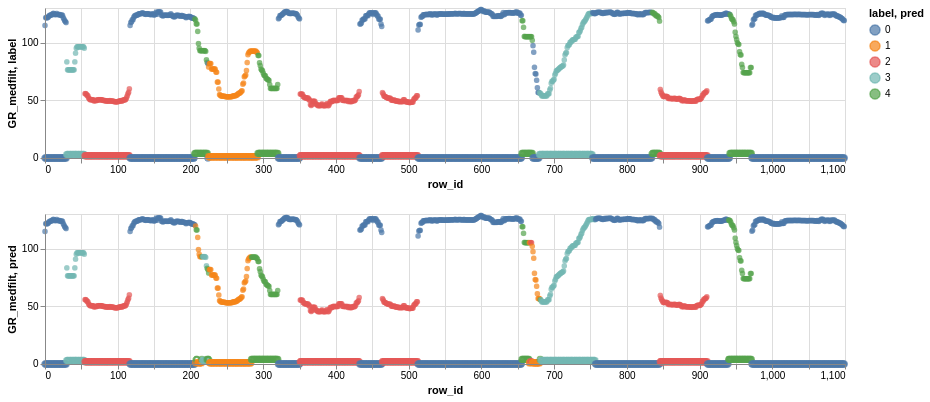

In [3]:
well_ids = df_train['well_id'].unique()[13]
df_sub = df_train[df_train['well_id'] == well_ids]
ch_gr = alt.Chart(df_sub,height=150,width=800).encode(x='row_id',y='GR_medfilt',order='row_id',color='label:N').mark_point(size=30,filled=True)
ch_grp = alt.Chart(df_sub,height=150,width=800).encode(x='row_id',y='GR_medfilt',order='row_id',color='pred:N').mark_point(size=30,filled=True)

ch_lab = alt.Chart(df_sub,height=150,width=800).encode(x='row_id',y='label',order='row_id',color='label:N').mark_point()
ch_pred = alt.Chart(df_sub,height=150,width=800).encode(x='row_id',y='pred',order='row_id',color='pred:N').mark_point()

(ch_gr + ch_lab) & (ch_grp + ch_pred)

Look at the distribution of labels per well

In [3]:
df_labels = pd.get_dummies(df_train['label'],prefix='lab')
df_labels['well_id'] = df_train['well_id']
df_labels.groupby('well_id').sum().hist(bins=55)

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f878c2911d0>,
      dtype=object)

# Prototype a few functions:

In [6]:
from sklearn.linear_model import LinearRegression
def diff_sum(x):
    res = np.diff(x).sum()
    return res
def abs_diff_sum(x):
    res = np.abs(np.diff(x)).sum()
    return res

def rolling_slope(x):
    model_ols =LinearRegression()
    idx=np.arange(x.shape[0])
    model_ols.fit(idx.reshape(-1, 1), x.reshape(-1, 1))
    res = model_ols.coef_[0]
    return res

    
def apply_rolling_functions(df,col='GR',window=10,func ={'mean':np.mean,'std':np.std,'diff_sum':diff_sum,'abs_diff_sum':abs_diff_sum,'slope':rolling_slope}):
    names =[]
    for k,v in func.items():
        series = df[col].rolling(window=window,center=True,min_periods=1).apply(v,raw=True)
        colname = f'{k}_{window}_{col}'
        df.loc[:,colname] = series.values
        names.append(colname)
    df.index = np.arange(df.shape[0])
    return df[names]
def preprocess_a_well(df_well):
    df_feats_w20 = apply_rolling_functions(df_well,window=20)
    df_feats_w60 = apply_rolling_functions(df_well,window=60)
    df_feats_w150 = apply_rolling_functions(df_well,window=150)
    df_feats = pd.concat([df_well,df_feats_w20,df_feats_w60,df_feats_w150],axis=1)
    return df_feats


# Figure out changepoints

/home/anton/miniconda3/envs/pg_model/lib/python3.7/site-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/home/anton/miniconda3/envs/pg_model/lib/python3.7/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.
/home/anton/miniconda3/envs/pg_model/lib/python3.7/site-packages/ipykernel_launcher.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try u

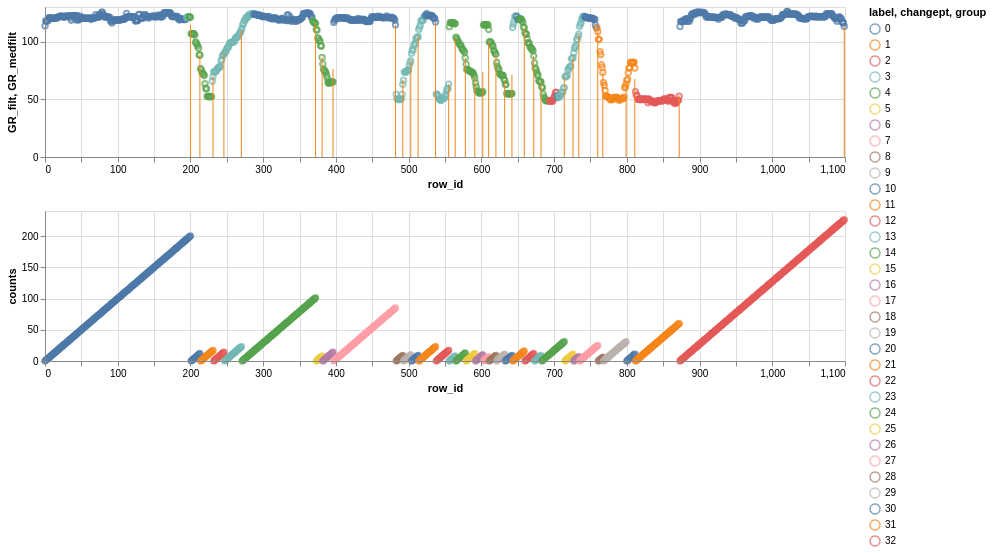

In [9]:
from scipy.signal import medfilt
import ruptures as rpt

df_sub = df_train[df_train['well_id'] == 80]

df_sub['GR_filt'] = medfilt(df_sub['GR'], 13)
algo = rpt.Pelt(model="rbf",min_size=5,jump=1).fit(df_sub['GR_filt'].values)
inds = np.array(algo.predict(pen=4))

df_sub['changept'] =  0
df_sub.iloc[inds-1,-1] = 1
x = np.zeros(df_sub.shape[0])
counts = np.zeros(df_sub.shape[0])
counts[:inds[0]] = np.arange(inds[0])
for i in range(len(inds)-1):
    x[inds[i]:inds[i+1]] = i
    counts[inds[i]:inds[i+1]] = np.arange(inds[i+1] - inds[i])
x=np.abs(x)
df_sub['group']  =x
df_sub['counts'] = counts
df_rules = df_sub.iloc[inds-1,:]



ch_l = alt.Chart(df_sub,height=150,width=800).encode(x='row_id',y='GR_filt',order='row_id',color='label:N').mark_point()
ch_l_group = alt.Chart(df_sub,height=150,width=800).encode(x='row_id',y='counts:Q',order='row_id',color='group:N').mark_point()
ch_p = alt.Chart(df_rules,height=150,width=800).encode(x='row_id',y='GR_medfilt',order='row_id',color="changept:N").mark_rule()

(ch_l+ch_p) & ch_l_group

/home/geoanton/anaconda3/envs/keras/lib/python3.6/site-packages/ipykernel_launcher.py:17: FutureWarning: Currently, 'apply' passes the values as ndarrays to the applied function. In the future, this will change to passing it as Series objects. You need to specify 'raw=True' to keep the current behaviour, and you can pass 'raw=False' to silence this warning
/home/geoanton/anaconda3/envs/keras/lib/python3.6/site-packages/ipykernel_launcher.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


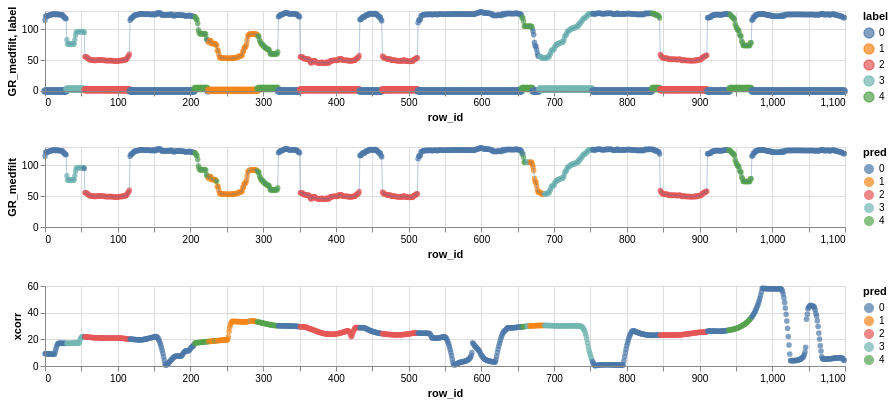

In [164]:
def make_parabolic(w,amp=50):
    x=[0,w/2,w]
    y=[amp,0,amp]
    p_coef = np.polyfit(x,y,2)
    p=np.poly1d(p_coef)
    x_new = np.arange(w)
    res = p(x_new)
    return res

def corr_with_parabolic(x, y):
    x = (x-x.mean())/x.std()
    y = (y-y.mean())/y.std()
    res = np.correlate(x,y).max()
    return res

template = make_parabolic(50,50)
df_sub['xcorr'] = df_sub['GR_medfilt'].rolling(window=150,min_periods = 50,center=True).apply(lambda x: corr_with_parabolic(x,template))

ch_gr = alt.Chart(df_sub[cols],height=80,width=800).encode(x='row_id',y='GR_medfilt',order='row_id',color='label:N').mark_point(size=30,filled=True)
ch_lab = alt.Chart(df_sub[cols],height=80,width=800).encode(x='row_id',y='label',order='row_id',color='label:N').mark_point()
ch_grp = alt.Chart(df_sub[cols],height=80,width=800).encode(x='row_id',y='GR_medfilt',order='row_id',color='pred:N').mark_point(size=30,filled=True)
ch_grp_l = alt.Chart(df_sub[cols],height=80,width=800).encode(x='row_id',y='GR_medfilt',order='row_id').mark_line(size=0.4)
ch_block = alt.Chart(df_sub[cols],height=80,width=800).encode(x='row_id',y='xcorr',order='row_id',color='pred:N').mark_point(size=30,filled=True)

((ch_gr + ch_lab+ch_grp_l ) & (ch_grp+ch_grp_l) & ch_block  ).resolve_scale(color='independent',y='independent')

     |████████████████████████████████| 61kB 1.1MB/s eta 0:00:011
